# Simulate loan approval decisions 

## Get the power of big simulations to build trust in your decision automation with IBM Cloud Pak for Business Automation

This notebook shows the exploitation of a dataset of loan approval automated by IBM Cloud Pak for Business Automation. More precisely we applied <b>Automation Decision Services</b> to model a low code decision service and deploy it as a rest endpoint. Form there we use a simulation microservice project called SimuLatte to generate analytical notebooks to get insights for the decision automation.

In this approach we dive into the automated decision dataset. For each decision we captured the request with all input parameters, the answer with all output parameters computed by the decision logic, and the trace. In the trace you find the list of the executed rules and ML models.

### LIBRAIRIES IMPORT

In [1]:
from urllib.parse import urlencode
from urllib.request import Request, urlopen

from faker import Faker

from pathlib import Path 

import json
import random 
import datetime

import os
import sys

import requests

import pandas as pd 
import numpy as np

from tqdm import tqdm

import uuid

import tempfile



import plotly
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.express as px
init_notebook_mode(connected = True)

import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pgeocode

import pyspark
from pyspark.sql import SparkSession
from pyspark import SparkContext

from joblib import Parallel, delayed

GLOBAL VARIBLES

In [2]:
SIMULATTE_BASE_DIR = os.environ['SIMULATTE_BASE_DIR']
SIMULATTE_ONLINE_HOSTNAME = os.environ['SIMULATTE_ONLINE_HOSTNAME'] 
SIMULATTE_ANALYTIC_HOSTNAME = os.environ['SIMULATTE_ANALYTIC_HOSTNAME'] 

DATASET GENERATION

In [6]:
serverDjangoEndpoint = f"http://{SIMULATTE_ANALYTIC_HOSTNAME}:8000/data/from-url/"
headers = {'Content-type': 'application/json'} 

spark_session = SparkSession.builder.master("local[1]") \
                    .appName('SparkByExamples.com') \
                    .getOrCreate()

spark_context = SparkContext.getOrCreate()

############## DATA FROM REMOTE CSV FILE ################
def make_request(client, card, merchand, transaction, riskThresholds, request):
    client["id"] = str(uuid.uuid4())

    card["id"] = str(uuid.uuid4())
    card["risk"] = random.uniform(0, 1)
    card["client"] = client

    merchand["id"] = str(uuid.uuid4())
    merchand["risk"] = random.uniform(0, 1)

    transaction["id"] = str(uuid.uuid4())
    transaction["amount"] = random.randint(5000, 100000)
    transaction["card"] = card
    transaction["client"] = client
    transaction["merchand"] = merchand

    riskThresholds["card"] = random.uniform(0, 1)
    riskThresholds["merchand"] = random.uniform(0, 1)

    request["transaction"] = transaction
    request["riskThresholds"] = riskThresholds

    return json.dumps(request)

def get_data_from(data_sink_filepath, size, executor="JSE", file_format="PARQUET"):
    # check if data sink file already exists
    file = Path(data_sink_filepath)
    if file.exists():
        file = open(data_sink_filepath,"r+")
        file.truncate(0)
        file.close()

    # Models
    request = dict()
    card = dict()
    client = dict()
    merchand = dict()
    riskThresholds = dict()
    transaction = dict()

    requests = []

    if(executor=="JSE"):
        for counter in range(0, size):
            requests.append(make_request(client, card, merchand, transaction, riskThresholds, request))
            """with open(data_sink_filepath, 'a') as file:
                    file.write(request)
                    file.write('\n')"""

        data = spark_context.textFile(data_sink_filepath)

    if(executor=="JSE_PARALLEL"):
        requests = Parallel(n_jobs=8)(
                        delayed(make_request)
                        (client, card, merchand, transaction, riskThresholds, request)
                        for row in tqdm(range(0,size))
                    )
        #data = spark_context.parallelize(requests) 
    
    if(executor=="SPARK"):
        requests = spark_context.parallelize(range(0, size)) \
                .map(lambda counter : make_request(client, card, merchand, transaction, riskThresholds, request)).collect()
        #data = spark_context.parallelize(range(0, size)) \
                #.map(lambda counter : make_request(client, card, merchand, transaction, riskThresholds, request))

   
    if len(requests)!=0:
        with open(data_sink_filepath, 'a') as file:
            for request in requests:
                file.write(request)
                file.write('\n')

        if(file_format=="PARQUET"):
            data = spark_context.textFile(data_sink_filepath)
            data.saveAsTextFile(os.path.splitext(data_sink_filepath)[0])

            if Path(data_sink_filepath).exists():
                os.remove(data_sink_filepath)
        

size = 1_000_000
filesize = size
date_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
if(size>999 and size<=999_999): filesize = str(size)[:-3]+"K"
if(size>999_999): filesize = str(size)[:-6]+"M"
data_filepath = f"{SIMULATTE_BASE_DIR}/data/ADS/fraudDetection/ads-22.0.1-frauddetection-requests-{date_time}-{filesize}.json"
get_data_from(data_filepath, size, "JSE", "PARQUET")

ConnectionRefusedError: [Errno 111] Connection refused

In [5]:
######## GET DATA #########
dataSourcePathADS = data_filepath

inputData = []
with open(dataSourcePathADS) as file:
    while (line := file.readline().rstrip()):
        inputData.append(json.loads(line))

data = pd.json_normalize(inputData, max_level=1)
data.head(5)
#print("Data source uri : ",dataSourcePathADS)

FileNotFoundError: [Errno 2] No such file or directory: '/home/jovyan/work/data/ADS/fraudDetection/ads-22.0.1-frauddetection-requests-20220930_160116-1M.json'

In [11]:
#To execute when using parquet files
dataSourcePathADS = os.path.splitext(data_filepath)[0]

CREATE SIMULATION 

In [20]:
datasinkFolderPath = f"{SIMULATTE_BASE_DIR}/data/ADS/fraudDetection"
createSimulationUrl = f"http://{SIMULATTE_ONLINE_HOSTNAME}:8080/v1/simulation/create"
adsEndpoint1 = "https://cpd-cp4a.apps.ads2201.cp.fyre.ibm.com/ads/runtime/api/v1/deploymentSpaces/embedded/decisions/_082392706%2Fbanking%2Fapproval_with_tasks%2FloanApprovalWithTasksDecisionService%2F1.1.0%2FloanApprovalWithTasksDecisionService-1.1.0.jar/operations/approvalWithTasks/execute"
adsEndpoint2 = "https://cpd-cp4a.apps.ads2201.cp.fyre.ibm.com/ads/runtime/api/v1/deploymentSpaces/embedded/decisions/_082213706%2Fpf2%2Fapproval_with_tasks%2FapprovalWithTasks-2DecisionService%2F1.4.0%2FapprovalWithTasks-2DecisionService-1.4.0.jar/operations/approvalWithTasks/execute"
token = "MDgyMjEzNzA2OjB6M3lwc29MZTJOOE1sQ2pDVDVSVXlmSHNXRDhDbjBKc1ZKZlN1aEI="
BASIC_AUTH_USERNAME = "drsManager"
BASIC_AUTH_PASSWORD = "manager"

simulationObject = {
    "uid": 0,
    "name": "my simu",
    "description": "string",
    "createDate": "2022-05-18T23:31:19.828Z",
    "trace": True,
    "dataSource": {
      "format": "JSON",
      "uri": dataSourcePathADS,
      "username": "string",
      "password": "string"
    },
    "dataSink": {
      "format": "JSON",
      "folderPath": datasinkFolderPath,
      "username": "string",
      "password": "string"
    },
    "decisionService": {
      "type": "ADS",
      "endPoint": adsEndpoint1,
      "authType": "BASIC_AUTH",
      "username": BASIC_AUTH_USERNAME,
      "password": BASIC_AUTH_PASSWORD,
      "key": "string",
      "value": "string",
      "token": token,
      "headerPrefix": "string"
    },
    "metrics": [
      {
        "uid": 0,
        "name": "string",
        "type": "SPARK_SQL",
        "description": "string",
        "expression": "string"
      }
    ],
    "kpi": [
      {
        "uid": 0,
        "name": "string",
        "type": "SPARK_SQL",
        "description": "string",
        "result": {}
      }
    ]
  }



############## CREATE SIMULATION ################
try:    
    createSimulation = requests.post(createSimulationUrl, data = json.dumps(simulationObject), headers=headers)
    print("URL : ", createSimulationUrl)
    print("RESPONSE STATUS : ", createSimulation.status_code, "\n")
    if(createSimulation.status_code==200):
        print("RESPONSE CONTENT : ", json.dumps(createSimulation.json(), indent=5), "\n")
    else:
        print("Check server side. ERROR : ", createSimulation.json()["message"])
except requests.exceptions.RequestException as e:  
    raise SystemExit(e)


URL :  http://simulation-service:8080/v1/simulation/create
RESPONSE STATUS :  200 

RESPONSE CONTENT :  {
     "uid": 1879,
     "userUid": 0,
     "name": "my simu",
     "description": "string",
     "createDate": "2022-09-28T12:54:00.213+00:00",
     "lastUpdateDate": "2022-09-28T12:54:00.213+00:00",
     "trace": true,
     "dataSource": {
          "format": "JSON",
          "uri": "/home/jovyan/work/data/ADS/fraudDetection/ads-22.0.1-frauddetection-requests-20220928_125320-10.json",
          "username": "string",
          "password": "string",
          "uid": 7813
     },
     "dataSink": {
          "format": "JSON",
          "folderPath": "/home/jovyan/work/data/ADS/fraudDetection",
          "uri": null,
          "username": "string",
          "password": "string",
          "uid": 7812
     },
     "decisionService": {
          "type": "ADS",
          "endPoint": "https://cpd-cp4a.apps.ads2201.cp.fyre.ibm.com/ads/runtime/api/v1/deploymentSpaces/embedded/decisions/_08

START SIMULATION

In [21]:
simulationUid = createSimulation.json()["uid"]
startSimulationUrl = f"http://{SIMULATTE_ONLINE_HOSTNAME}:8080/v1/simulations/{simulationUid}/start/"
notebook_uri = f"{SIMULATTE_BASE_DIR}/notebooks/ADS/ads-vs-odm-loanvalidation-analytics.ipynb"
url_DSA1 = f"{SIMULATTE_BASE_DIR}/libs/ADS/DSA/fraud_detection_1.1.0.jar"
url_DSA2 = f"{SIMULATTE_BASE_DIR}/libs/ADS/DSA/fraud_detection_1.2.0.jar"
url_DSA6 = f"{SIMULATTE_BASE_DIR}/libs/ADS/DSA/fraud_detection_1.6.0.jar"
url_DSA9 = f"{SIMULATTE_BASE_DIR}/libs/ADS/DSA/fraud_detection_1.9.0.jar"

operation_name = "detect-fraud-in-card-transactions"

run_config = {
    "name": "frauddetection",
    "description": "string",
    "createDate": "2022-05-18T23:31:19.828Z",
    "trace": False,
    "dataSink": {
      "format": "PARQUET",
      "uri": f"{SIMULATTE_BASE_DIR}/data/ADS/fraudDetection/ads-22.0.1-frauddetection-decisions-tiemoko-{filesize}.json",
      "folderPath": datasinkFolderPath,
      "username": "string",
      "password": "string"
    },
    "decisionService": {
      "type": "ADS",
      "endPoint": url_DSA9,
      "operationName": operation_name,
      "authType": "BASIC_AUTH",
      "username": BASIC_AUTH_USERNAME,
      "password": BASIC_AUTH_PASSWORD,
      "key": "string",
      "value": "string",
      "token": token,
      "headerPrefix": "string"
    },
    "executor": {
        "type": "SPARK_STANDALONE",
        "mode": "LOCAL",
        "capability": "ODM",
        "uid": 0
    },
    "optimization": False,
    "optimizationParameters": [],
    "notebookUri": notebook_uri
  }

############## START SIMULATION ################
try:    
    startSimulation = requests.post(startSimulationUrl, data = json.dumps(run_config), headers=headers)
    print("URL : ", startSimulationUrl)
    print("RESPONSE STATUS : ", startSimulation.status_code, "\n")
    if(startSimulation.status_code==200):
        print("YOUR SIMULATION IS STARTED !!! \n")
        print("RESPONSE CONTENT : ", json.dumps(startSimulation.json(), indent=5), "\n")
    else:
        if(startSimulation.status_code==500):
            print("Check server side. ERROR : ", startSimulation.json()["error"])
            print("Check server side. PATH : ", startSimulation.json()["error"])
        else:
            print("Check server side. ERROR : ", startSimulation.json()["message"])
except requests.exceptions.RequestException as e:  
    raise SystemExit(e)

URL :  http://simulation-service:8080/v1/simulations/1879/start/
RESPONSE STATUS :  200 

YOUR SIMULATION IS STARTED !!! 

RESPONSE CONTENT :  {
     "uid": 4056,
     "simulationUid": 1879,
     "name": "frauddetection",
     "description": "string",
     "createDate": "2022-09-28T12:54:05.998+00:00",
     "trace": false,
     "optimization": false,
     "dataSource": null,
     "dataSink": {
          "format": "PARQUET",
          "folderPath": "/home/jovyan/work/data/ADS/fraudDetection",
          "uri": "/home/jovyan/work/data/ADS/fraudDetection/ads-22.0.1-frauddetection-decisions-tiemoko-10.json",
          "username": "string",
          "password": "string",
          "uid": 7814
     },
     "decisionService": {
          "type": "ADS",
          "endPoint": "/home/jovyan/work/libs/ADS/DSA/fraud_detection_1.9.0.jar",
          "authType": "BASIC_AUTH",
          "operationName": "detect-fraud-in-card-transactions",
          "username": "drsManager",
          "password": "man

GET RUN REPORT

In [26]:
simulationUid = startSimulation.json()["simulationUid"]
runUid = startSimulation.json()["uid"]
runReportUrl = f"http://{SIMULATTE_ONLINE_HOSTNAME}:8080/v1/simulations/{simulationUid}/runs/{runUid}/actions/get_report"

############## RUN REPORT ################
try:    
    runReport = requests.post(runReportUrl)
    print("RESPONSE STATUS : ", runReport.status_code, "\n")
    if(runReport.status_code==200):
        print("RUN REPORT : ", json.dumps(runReport.json(), indent=5), "\n")
    else:
        print("Check server side. ERROR : ", runReport.json()["message"])
except requests.exceptions.RequestException as e:  
    raise SystemExit(e)

KeyboardInterrupt: 

PAUSE SIMULATION 

In [ ]:
simulationUid = startSimulation.json()["simulationUid"]
runUid = startSimulation.json()["uid"]
pauseSimulationUrl = f"http://{SIMULATTE_ONLINE_HOSTNAME}:8080/v1/simulations/{simulationUid}/runs/{runUid}/actions/pause"

############## PAUSE SIMULATION ################
try:    
    pauseSimulation = requests.post(pauseSimulationUrl)
    print("RESPONSE STATUS : ", pauseSimulation.status_code, "\n")
    if(pauseSimulation.status_code==200):
        print("YOUR SIMULATION IS PAUSED !!! \n")
        print("RESPONSE CONTENT : ", pauseSimulation.json()["message"], "\n")
    else:
        print("Check server side. ERROR : ", pauseSimulation.json()["message"])
except requests.exceptions.RequestException as e:  
    raise SystemExit(e)

CONTINUE TO RUN 

In [ ]:
simulationUid = startSimulation.json()["simulationUid"]
runUid = startSimulation.json()["uid"]
continueSimulationUrl = f"http://{SIMULATTE_ONLINE_HOSTNAME}:8080/v1/simulations/{simulationUid}/runs/{runUid}/actions/continue"

############## CONTINUE SIMULATION ################
try:    
    continueSimulation = requests.post(continueSimulationUrl)
    print("RESPONSE STATUS : ", continueSimulation.status_code, "\n")
    if(continueSimulation.status_code==200):
        #print("YOUR SIMULATION IS RUNNING !!! \n")
        print("RESPONSE CONTENT : ", continueSimulation.json()["message"], "\n")
    else:
        print("Check server side. ERROR : ", continueSimulation.json()["message"])
except requests.exceptions.RequestException as e:  
    raise SystemExit(e)

## 1 - Read the decision dataset

This report post processes the result of a simulation that wrote a dataset of automataed decisions in a data lake or a local file system. The first decisions found in the simulation dataset look like below:

In [35]:
datasinkPath = startSimulation.json()["dataSink"]["uri"] #f"{SIMULATTE_BASE_DIR}/data/ADS/loanvalidation/run_my runner_20220701_170948.json"

outputData = []
if os.path.exists(datasinkPath):
    with open(datasinkPath) as file:
        filesize = os.path.getsize(datasinkPath)
        if filesize == 0:
            print("The file {} is empty".format(datasinkPath))
        else:
            while (line := file.readline().rstrip()):
                jsonLine = dict()
                line_to_json = json.loads(line)
                jsonLine["request"] = line_to_json["request"]
                if(line_to_json["trace"]=="empty"): 
                    jsonLine["trace"] = "empty" 
                else: 
                    jsonLine["trace"] = line_to_json["trace"]
                jsonLine["response"] = line_to_json["response"]

                outputData.append(jsonLine)

datasink = pd.json_normalize(outputData)
datasink.head(5)

,request.loan.amount,request.loan.loanToValue,request.loan.numberOfMonthlyPayments,request.loan.startDate,request.borrower.firstName,request.borrower.lastName,request.borrower.zipCode,request.borrower.creditScore,request.borrower.birthDate,request.borrower.yearlyIncome,...,response.borrower.yearlyIncome,response.borrower.spouse,response.borrower.SSN.serialNumber,response.borrower.SSN.areaNumber,response.borrower.SSN.groupCode,response.__DecisionID__,response.messages,response.dataValidated,response.yearlyInterestRate,response.insurance
0,783440,0.7,162,2005-06-01T00:00:00Z,Marcus,Torres,23941,736,1979-05-12T00:00:00Z,113243,...,113243,None,6789,469,45,fd9b7370-5bd7-4b03-b888-8233c79b8357,"[Too big Debt/Income ratio, Very low risk loan...",True,0.082,NaN
1,1787385,0.7,183,2005-06-01T00:00:00Z,Jimmy,Wallace,36977,527,1987-05-12T00:00:00Z,224186,...,224186,None,6789,651,45,fee62b5f-6eb3-46db-a4bc-c08851c3e8ee,[The loan cannot exceed 1300000],False,0.000,NaN
2,1733494,0.7,75,2005-06-01T00:00:00Z,Jennifer,Singleton,86342,460,1902-05-12T00:00:00Z,39954,...,39954,None,6789,003,45,08a0723e-f07d-4ded-949a-a69438473808,[The loan cannot exceed 1300000],False,0.000,NaN
3,1350004,0.7,72,2005-06-01T00:00:00Z,William,Davis,02488,751,1898-05-12T00:00:00Z,219998,...,219998,None,6789,489,45,69922eaf-116f-4aa3-a592-8d163da1a81b,[The loan cannot exceed 1300000],False,0.000,NaN
4,1210944,0.7,160,2005-06-01T00:00:00Z,Amy,Campos,09546,684,1987-05-12T00:00:00Z,72470,...,72470,None,6789,980,45,078258d0-2296-499f-b1f1-933e71b326e4,"[Too big Debt/Income ratio, Very low risk loan...",True,0.082,NaN


## 2 - Business Metrics

From each raw decision we extract or compute a set of metrics. The accepted versus rejected classification is a metric, All raw input and output metrics are eligible to be metrics. Main metrics used in this report are:

<ul>
<li>accepted/rejected status,</li>
<li>loan amount,</li>
<li>borrower's credit score,</li>
<li>borrower's yearly income</li>
</ul>

In [78]:
########### Graphs config #############
approval_colors = ["#00CC96", "#FF6692"]
color_indices = [0, 1]

pie_chart_approval_loan_names = ['approved', 'rejected']
pie_chart_loan_amount_names = ['approved amount', 'rejected amount']
bidirectional_bar_chart_label_v2=['number of applications', 'sum of applications amounts']
bidirectional_bar_chart_label=['number of applications', 'sum of applications amounts']
bidirectional_bar_chart_label=['number of rejected applications', 'sum of rejected applications amounts', 'number of approved applications', 'sum of approved applications amounts']
radar_chart_labels=['number of rejected applications', 'sum of rejected applications amounts', 'number of approved applications', 'sum of approved applications amounts', 'ratio approved/requested']

In [79]:
########### Metrics #############
select_approved_decision = '`response.approved` == True'
select_rejected_decision = '`response.approved` == False'

get_decision_approval = 'response.approved'
get_decision_amount = 'response.loan.amount'
get_decision_borrower_zipcode = 'response.borrower.zipCode'
get_decision_borrower_yearly_income = 'response.borrower.yearlyIncome'
get_decision_borrower_credit_score = "response.borrower.creditScore"
get_decision_id = 'response.__DecisionID__'
get_decision_reimbursement_rate = 'response.yearlyInterestRate'
get_decision_monthly_repayment = 'response.monthlyRepayment'


## 3 - Business KPIs

Key Performance Indicators are aggregated counters to judge the decision set. Examples of basic KPIs for loan approval are:

<ul>
<li>Sum of approved applications / total number of applications,</li>
<li>Sum of rejected applications / total number of applications,</li>
<li>Total of approved loan amounts,</li>
<li>Total of rejected loan amounts</li>
</ul>

Only limits are the imagination and computational power of Python, Scala or R languages.

In [80]:
########### KPI #############
approved_loan = datasink.query(select_approved_decision)
rejected_loan = datasink.query(select_rejected_decision)

########### Approved/Rejected PRINT #############
print("Number of approved loan request = ", approved_loan.shape[0])
print("Number of rejected loan request = ", rejected_loan.shape[0])
print("Rate of approval = ", approved_loan.shape[0]/datasink.shape[0])

print("Total approved amount = ",datasink.query(select_approved_decision)[get_decision_amount].sum())
print("Total rejected amount = ",datasink.query(select_rejected_decision)[get_decision_amount].sum())
print("Total requested amount = ",datasink[get_decision_amount].sum())


Number of approved loan request =  925
Number of rejected loan request =  4075
Rate of approval =  0.185
Total approved amount =  274938211
Total rejected amount =  4767814177
Total requested amount =  5042752388


## 3 - Visualization

### 3.1 Approval vs Rejection

We use donuts representation to get an overview of the acceptation of the loans, in terms of number of applications and loan amounts.

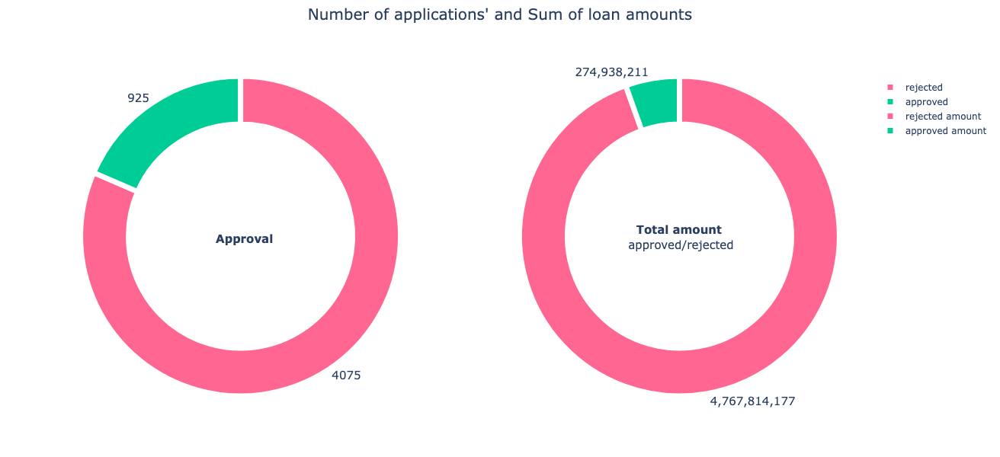

In [81]:
########### settings ###########
donut_hole = 0.7

########### Approved/Rejected PIE CHART #############
trace_approval = go.Pie(labels = pie_chart_approval_loan_names,
                            values = [approved_loan.shape[0], rejected_loan.shape[0]],
                            hole = donut_hole)

########### Approved/Rejected Amount PIE CHART #############
trace_amount = go.Pie(values= [datasink.query(select_approved_decision)[get_decision_amount].sum(),
                                 datasink.query(select_rejected_decision)[get_decision_amount].sum()],
                            labels=pie_chart_loan_amount_names,
                            hole = donut_hole,
                            name="Loan amount")

fig = make_subplots(rows=1, cols=2,
                    specs=[[{"type": "pie"}, {"type": "pie"}]],
                    column_widths=[0.5, 0.5],
                    #vertical_spacing=0.001,
                    subplot_titles=("Approval", "Approved/rejected amount")
                    )

fig.add_trace(trace_approval, row=1, col=1)
fig.add_trace(trace_amount, row=1, col=2)

fig.update_traces(hoverinfo='label', textinfo='value', textfont_size=15, textposition="outside",
                  marker=dict(colors=approval_colors, line=dict(color='#FFFFFF', width=7)))
                
fig.update_annotations(yshift=20) # subplot tiltes

fig.update_layout(
    barmode='stack',
    plot_bgcolor = "white",
    #paper_bgcolor = 'lightgray',
    height=600,
    title={'text': f"Number of applications and Sum of loan amounts",
          'x':0.5,
          'y':0.98,
          'xanchor': 'center',
          'font_size': 20
    },
    annotations= [
         {
            "font": {
               "size": 15
            },
            "showarrow": False,
            "text": "<b>Approval</b>",
            "x": 0.23,
            "y": 0.42
         },
         {
            "font": {
               "size": 15
            },
            "showarrow": False,
            "text": "<b>Total amount</b><br> approved/rejected",
            "x": 0.775,
            "y": 0.4
         }
      ],
      )

iplot(fig)

### 3.2 Represent the decisions in a yearly income, loand amount, and approval outcome

We leverage a scatter component to represent all decisions. Each decision is colored in pink if refused or green if accepted. The circle radius depends on the amount. You can zoom in, select one decision, and get a tooltip with a summary of the decision.

We added 2 lines in the view:

<ul>
<li>one horizontal line that matches a business rule that rejectsany application with a loan amount greater than 1 M.</li>
<li>one diagonal that separates the population of never accepted application from one where accepted applications are concentrated. This observation is consistent with busines rules that enforced a maximum income/reimbursement ratio.</li>
</ul>

In [82]:
def array_normalize(values, max_value=1):
    normalized_values = []
    for value in values:
        normalized_values.append((value*max_value)/max(values))
    return normalized_values

def set_colors(values, true_color="#00CC96", false_color="#FF6692"):
    colors = []
    for value in values:
        if(value): 
            colors.append(true_color) 
        else: 
            colors.append(false_color) 
    return colors

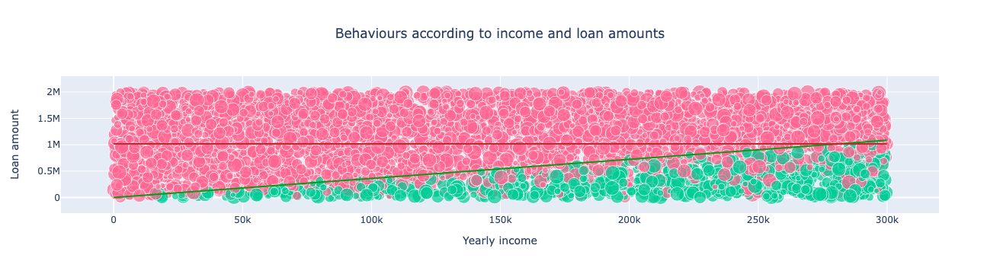

In [83]:
fig = go.Figure()
fig.add_trace(go.Scatter(
                 x=datasink[get_decision_borrower_yearly_income],
                 y=datasink[get_decision_amount],
                 mode='markers',
                 marker_size=array_normalize(datasink[get_decision_borrower_credit_score], 20), 
                 marker_color=set_colors(datasink[get_decision_approval]),
                 text=datasink[get_decision_approval], 
                 hovertext=datasink[get_decision_id],
                 hovertemplate="<b>Income:</b> %{x}<br><b>Loan amount:</b> %{y}<br><b>Approval:</b> %{text}<br><b>Id:</b> %{hovertext}<extra></extra>",
                 name='V1'
))


fig.add_trace(
    go.Scatter(
        x=np.array([0, max(datasink[get_decision_borrower_yearly_income])]),
        y=max(datasink.query(select_approved_decision)[get_decision_amount]/datasink.query(select_approved_decision)[get_decision_borrower_yearly_income])*np.array([0, max(datasink[get_decision_borrower_yearly_income])]),
        mode="lines",
        line=go.scatter.Line(color="#109618"),
        showlegend=False)
)
fig.add_trace(
    go.Scatter(
        x=np.array([0, max(datasink[get_decision_borrower_yearly_income])]),
        y=max(datasink.query(select_approved_decision)[get_decision_amount])*np.array([1, 1]),
        mode="lines",
        line=go.scatter.Line(color="#B82E2E"), ##B82E2E
        showlegend=False)
)


fig.update_xaxes(title_text='Yearly income')
fig.update_yaxes(title_text='Loan amount')

fig.update_layout(
    barmode='stack', 
    showlegend=False,
    title={'text': f"Behaviours according to income and loan amounts",
          'x':0.5,
          'xanchor': 'center'
    })

iplot(fig)

### 3.3 Evaluate business ratio 

We compute the max debt on income ratio for the two versions.

In [84]:
rate1 = max(datasink.query(select_approved_decision)[get_decision_monthly_repayment]*12/datasink.query(select_approved_decision)[get_decision_borrower_yearly_income])
print("Max debt on income ratio detected V1 : ",rate1)

Max debt on income ratio detected V1 :  0.3295912383715464


### 3.4 Visualize approvals on yearly income and credit scores

We use a scatter view to represent the decisions this time with yearly income and credit score. We observe 2 gradients that cumulate their effects:
<ul>
<li>the higher yearly income is the more likelyhood to get the loan accepted</li>
<li>the higher is the credit score the more likelyhood to get the loan accepted</li>
</ul>

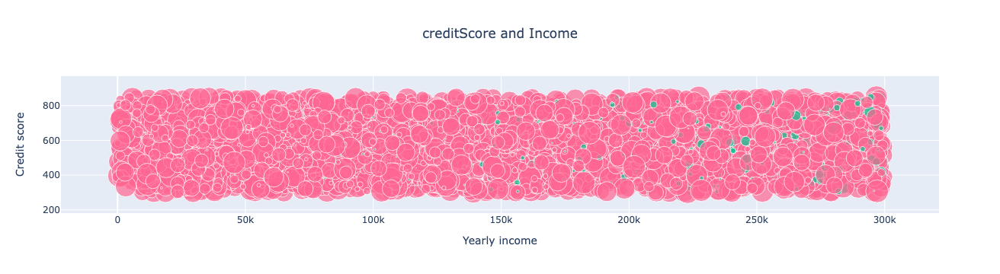

In [85]:
############ SCATTER CHART #############
fig = go.Figure()
max_marker_size = 30
fig.add_trace(go.Scatter(
                 x=datasink[get_decision_borrower_yearly_income],
                 y=datasink[get_decision_borrower_credit_score],
                 mode='markers',
                 marker_size=array_normalize(datasink[get_decision_amount], max_marker_size), 
                 marker_color=set_colors(datasink[get_decision_approval]),
                 text=datasink[get_decision_approval], 
                 hovertemplate="<b>Income:</b> %{x}<br><b>creditScore:</b> %{y}<br><b>Approval:</b> %{text}<extra></extra>",
                 name='V1'
))

fig.update_xaxes(title_text='Yearly income')
fig.update_yaxes(title_text='Credit score')

fig.update_layout(
    barmode='stack', 
    showlegend=False,
    title={'text': f"creditScore and Income",
          'x':0.5,
          'xanchor': 'center'
    })

iplot(fig)

### 3.5 Visualize Multiple Business KPIs

We use a radar (named too as Kiviat diagram or spyder) to represent the relative performances of the decision set.

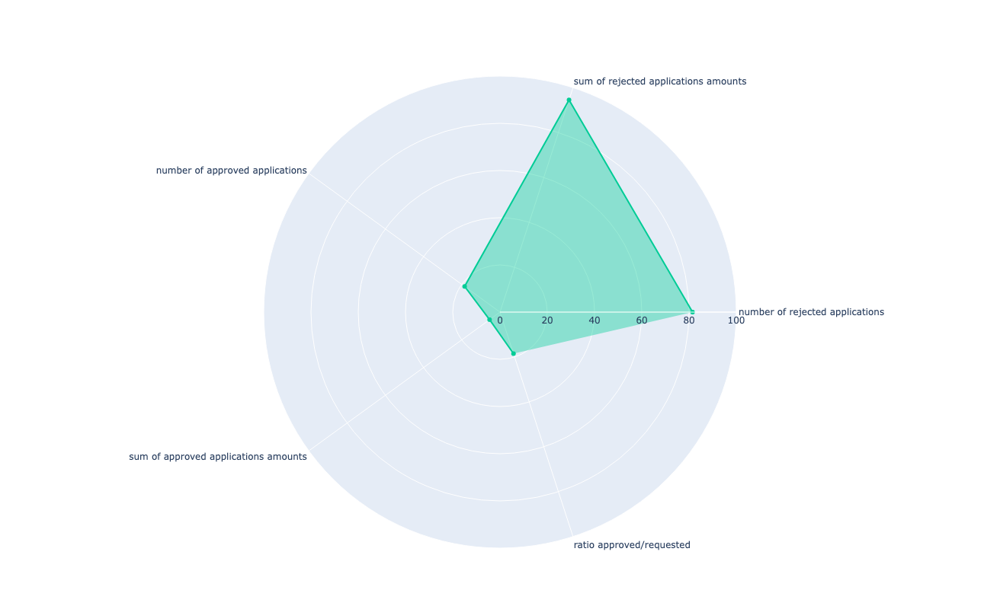

In [86]:
fig = go.Figure()

#radar dimension normalization 
radar_max_value = 100

values = np.array([[datasink.query(select_rejected_decision).shape[0], 
                    datasink.query(select_rejected_decision)[get_decision_amount].sum(), 
                    datasink.query(select_approved_decision).shape[0], 
                    datasink.query(select_approved_decision)[get_decision_amount].sum(), 
                    datasink.query(select_approved_decision).shape[0]/(datasink.query(select_approved_decision).shape[0]+datasink.query(select_rejected_decision).shape[0])
                   ],
                   [
                    datasink.shape[0],
                    datasink[get_decision_amount].sum(),
                    datasink.shape[0],
                    datasink[get_decision_amount].sum(),
                    1
                   ]
                  ])
normed_values = (values*radar_max_value) / values.max(axis=0)

def radar_normalization(values, max_value):
    normalized_values = []
    for value in values:
        normalized_values.append((value*max_value)/max(values))
    return normalized_values

fig.add_trace(go.Scatterpolar(
      r=normed_values[0],
      theta=radar_chart_labels,
      marker_color='rgb(0,204,150)',
      fillcolor='rgba(0,204,150,0.4)',
      fill='toself',
      name='V1',
))

fig.update_layout(
  height=800,
  polar=dict(
    #bgcolor= 'rgb(239, 239, 232)',
    radialaxis=dict(
      visible=True,
      range=[0, radar_max_value],
      #linecolor='red',
      #gridcolor='red',
      #axiscolor='red',
      #tickcolor='red',
    )),
  #showlegend=False
)

fig.show()

### 3.6 Show the approval distributions

We use violon representations to show the distributions of the approved versus rejected applications projected on the loan amount dimension. A confirmation accepted applications are under the 1M limit and are concentrated on low amounts.

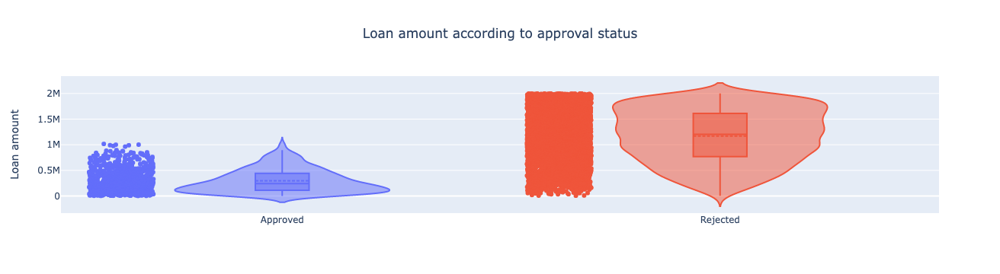

In [87]:
subplot_titles = ['Approved', 'Rejected']
select_decision_approval_status = [select_approved_decision, select_rejected_decision]
get_decision_value = [get_decision_amount, get_decision_amount]
fig = go.Figure()
for idx, approval in enumerate(select_decision_approval_status):
    fig.add_trace(go.Violin(y=datasink.query(approval)[get_decision_amount],
                            name=subplot_titles[idx],
                            box_visible=True,
                            meanline_visible=True,
                            points='all'
                            ))

fig.update_yaxes(title_text='Loan amount')

fig.update_layout(
    barmode='stack', 
    showlegend=False,
    title={'text': f"Loan amount according to approval status",
          'x':0.5,
          'xanchor': 'center'
    })

fig.show()

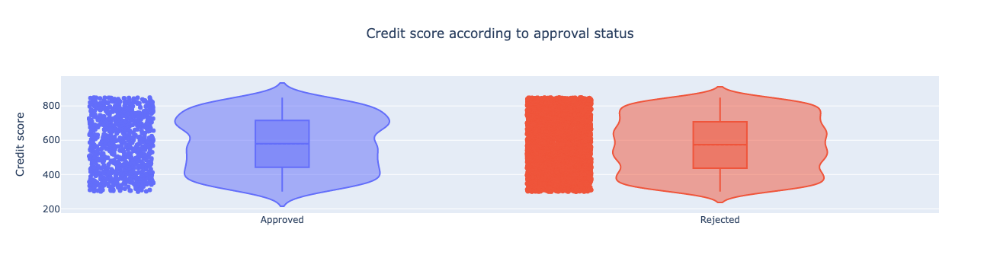

In [88]:
subplot_titles = ['Approved', 'Rejected']
select_decision_approval_status = [select_approved_decision, select_rejected_decision]
get_decision_value = [get_decision_amount, get_decision_amount]
fig = go.Figure()
for idx, approval in enumerate(select_decision_approval_status):
    fig.add_trace(go.Violin(y=datasink.query(approval)[get_decision_borrower_credit_score],
                            name=subplot_titles[idx],
                            box_visible=True,
                            meanline_visible=True,
                            points='all'
                            ))

fig.update_yaxes(title_text='Credit score')

fig.update_layout(
    barmode='stack', 
    showlegend=False,
    title={'text': f"Credit score according to approval status",
          'x':0.5,
          'xanchor': 'center'
    })

fig.show()

### 3.7 - Take benefit of geographical tagging

We leverage the zipcode input parameter to locate the borrowers. It can help to detect if any correlation between the location (country, state) and the approval decision.

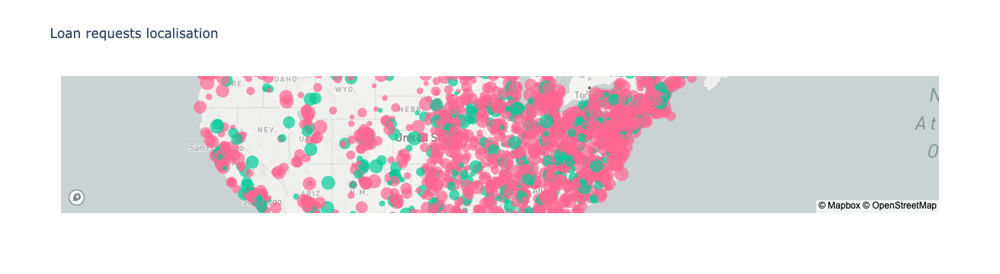

In [89]:
mapbox_access_token = "pk.eyJ1IjoiZGVtYmVsZXQiLCJhIjoiY2t0Mm5oeWo4MGx6ODJ3cXAwejNtMTFncCJ9.9cyxovpJjJUINMrw4ofe_g"

nomi = pgeocode.Nominatim('us')

df=nomi.query_postal_code(datasink[get_decision_borrower_zipcode].values)

fig = go.Figure(data=go.Scattermapbox(
        lon = df['longitude'],
        lat = df['latitude'],
        text = df['place_name'],
        mode = 'markers',
        marker=go.scattermapbox.Marker(
            size=array_normalize(datasink[get_decision_borrower_credit_score], 20),
            color=set_colors(datasink[get_decision_approval])
        ),
        ))

fig.update_layout(
    title='Loan requests localisation',
    autosize=True,
    hovermode='closest',
    showlegend=False,
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=df['latitude'].mean(),
            lon=df['longitude'].mean()
        ),
        pitch=0,
        zoom=3,
        style='light'
    ),
)

fig.show()

## 4 - Go inside the decisions

We exploit the trace in each of the decision to extract how their outcome was computed. We get the executed and we aggregate them to understand their coverage for this decision set.

This section below allows you to obtain all executed and not executed rules from a specific decision by filling in the decision  Id.  

In [90]:
decisionId = "affba36a-ef3d-4698-a783-ae760315696a"
all_tasks = datasink.query(f'`response.__DecisionID__`=="{decisionId}"')['trace.rootRecord.properties.allTasks'].values
not_executed_tasks = datasink.query(f'`response.__DecisionID__`=="{decisionId}"')['trace.rootRecord.properties.notExecutedTasks'].values
 
executed_tasks = [item for item in all_tasks]
for task in not_executed_tasks:
  if task in all_tasks:
    executed_tasks.remove(task)

print("All tasks : " , datasink.query(f'`response.__DecisionID__`=="{decisionId}"')['trace.rootRecord.properties.allTasks'])
print("The executed tasks are : " + str(executed_tasks))
#print("The not executed tasks are : " + str(not_executed_tasks))

All tasks :  Series([], Name: trace.rootRecord.properties.allTasks, dtype: object)
The executed tasks are : []


In [15]:
def get_rules(record, tasksList=dict()):
    rules = []
    fromTasks = tasksList
    if record["recordType"]=="Rule":
        #delete index in fromTasks
        for index in list(fromTasks.keys())[::-1]:
            if int(index.replace(".", "")) != int(record['recordIndex'].replace(".", "")[0:len(index.replace(".", ""))]): 
                fromTasks.pop(index)

        fromTasks[record['recordIndex']] = record['properties']['name']
        record["from"] = {k:v for k,v in fromTasks.items()}
        rules.append(record)
    else:
        if "nestedRecords" in record["properties"]:
            fromTasks[record['recordIndex']] = record['properties']['name'] if 'name' in record['properties'] else record['properties']['mainTask']
            for new_record in record["properties"]["nestedRecords"]:
                rules.extend(get_rules(new_record, fromTasks))
    
    return rules

UNIT TEST SANKEY

In [16]:
import json
f = open("/Users/tiemokodembele/Documents/internShip/simulatte/data/ADS/trace-ruleflow-structure.json", "r")
file = f.read()
trace = json.loads(file)
rules = []

rules = get_rules(trace['executionTrace']['rootRecord'])

print(json.dumps(rules[0], indent=4))

{
    "recordType": "Rule",
    "recordIndex": "1.1.2.1",
    "properties": {
        "name": "Validation.borrower.check SSN area number",
        "boundObjectsAtStart": {
            "loan": "decisions.techpreview_samples.loan_validation.loanvalidationdata.Loan@a52cff84",
            "borrower": "decisions.techpreview_samples.loan_validation.loanvalidationdata.Borrower@7b890cdd"
        },
        "actionIndex": "1",
        "boundObjectsAtEnd": {
            "loan": "decisions.techpreview_samples.loan_validation.loanvalidationdata.Loan@a52cff84",
            "borrower": "decisions.techpreview_samples.loan_validation.loanvalidationdata.Borrower@7b890cdd"
        },
        "executionDuration": 1
    },
    "from": {
        "1": "Approval main flow",
        "1.1": "Approval main flow",
        "1.1.2": "Approval main flow>task_1",
        "1.1.2.1": "Validation.borrower.check SSN area number"
    }
}


GET ALL RULES FROM ALL DECISIONS IN THE DATASET

In [105]:
rules = []
not_executed_rules = []
number_of_rules_per_decision = []

for number_of_decision in range(0,len(outputData)):
    nested_records = outputData[number_of_decision]['trace']['rootRecord']['properties']['nestedRecords']
    not_executed_rules.extend(outputData[number_of_decision]['trace']['rootRecord']['properties']['notExecutedTasks'])
    for record in nested_records:
        rules.extend(get_rules(record))

#print("RULES : ", rules)

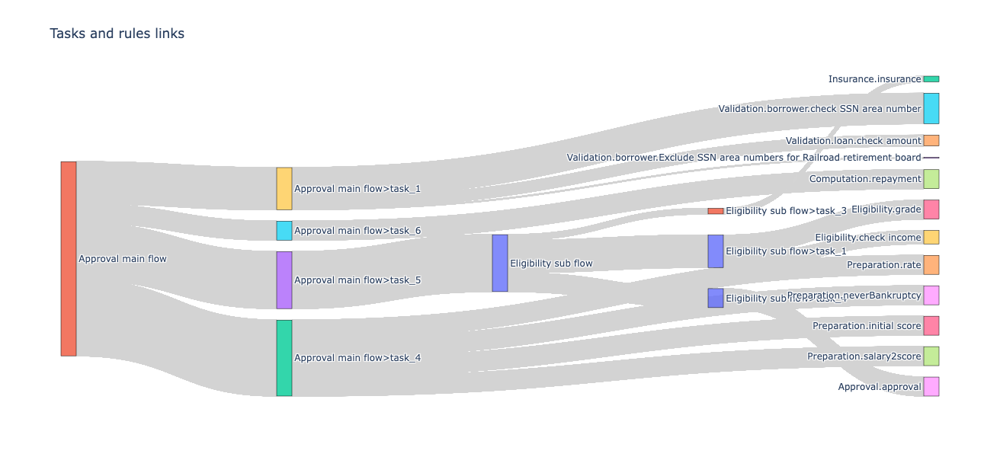

In [111]:
#################### setting #################
sources = []
targets = []
labels = []
values = []

for rule in rules:
    labels.extend(list(rule["from"].values()))

labels = list(set(labels))
for rule in rules:
    for item_source, item_target in zip(list(rule["from"].values())[0::1], list(rule["from"].values())[1::1]):
        sources.append(labels.index(item_source))
        targets.append(labels.index(item_target))
        values.append(1)

    sources.append(labels.index(list(rule["from"].values()).pop()))
    targets.append(labels.index(list(rule["from"].values()).pop()))
    values.append(0)

##################### SANKEY PLOT #################
fig = go.Figure(data=[go.Sankey(
    valueformat = ".0f",

    # Define nodes
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      #color = [random.choice(px.colors.qualitative.Plotly) for i in range(0, len(labels))]
    ),

    # Add links
    link = dict(
      source = sources, 
      target = targets,
      value = values,
      label = labels,
      color = "lightgrey"
      #color = [random.choice(px.colors.qualitative.Set3) for i in range(0, len(labels))]
  ))])

fig.update_layout(title_text="Tasks and rules links", height=600, ) #width=2000
fig.show()

SUNBURST

/Users/tiemokodembele/opt/anaconda3/envs/jupyter_client/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/Users/tiemokodembele/opt/anaconda3/envs/jupyter_client/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/Users/tiemokodembele/opt/anaconda3/envs/jupyter_client/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/Users/tiemokodembele/opt/anaconda3/envs/jupyter_client/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/Use

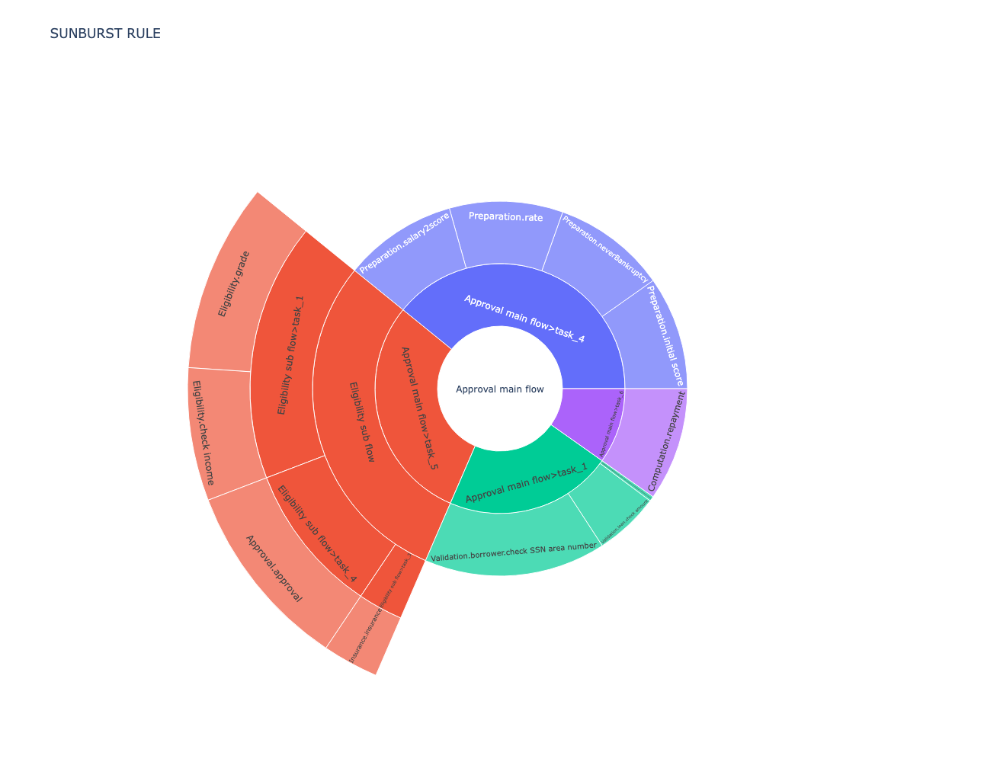

In [95]:
data = []

number_of_columns = 0
for rule in rules:
    number_of_columns = max(number_of_columns, len(rule["from"]))

for rule in rules:
    rule_data = dict()
    keys = list(rule["from"])
    for i in range(0, number_of_columns):
        if i < len(rule["from"]):
            rule_data[f"Column{i}"] = rule["from"][keys[i]]
        else: rule_data[f"Column{i}"] = 'None'

    data.append(rule_data)

df = pd.DataFrame(data)
df = df.groupby(df.columns.tolist()).size().reset_index().rename(columns={0:'Count'})
df = df.replace(['None'],None)
fig = px.sunburst(df, 
                  path=[f"Column{i}" for i in range(0, number_of_columns)], 
                  values="Count",
                  height=1000,
                  title="SUNBURST RULE",
                  maxdepth=5
                  )
fig.show()

In [96]:
rules_counter = dict()
for rule in rules:
    if rule['properties']['name'] in rules_counter:
        rules_counter[rule['properties']['name']] += 1
    else :
        rules_counter[rule['properties']['name']] = 1


#for not_executed_rule in set(not_executed_rules):
#    rules_counter[not_executed_rule] = 0

rules_coverage = pd.DataFrame(rules_counter.items(), columns=['Rule', 'Count'])
rules_coverage['Percentage']= (rules_coverage['Count']*100)/datasink.shape[0]

rules_coverage

,Rule,Count,Percentage
0,Validation.borrower.check SSN area number,5000,100.00
1,Preparation.initial score,3119,62.38
2,Preparation.neverBankruptcy,3119,62.38
3,Preparation.rate,3119,62.38
4,Preparation.salary2score,3119,62.38
5,Computation.repayment,3119,62.38
6,Eligibility.check income,2194,43.88
7,Eligibility.grade,3119,62.38
8,Approval.approval,3119,62.38
9,Validation.loan.check amount,1785,35.70


### 4.1 Rule coverage bar graph

This view show all executed rules with its execution percentage. 100% means that the rule has been executed in all decisions. The rule coverage empowers business users to check if the statistics of rule execution match their expectations and hypothesis when applied to the applications, and data in general.

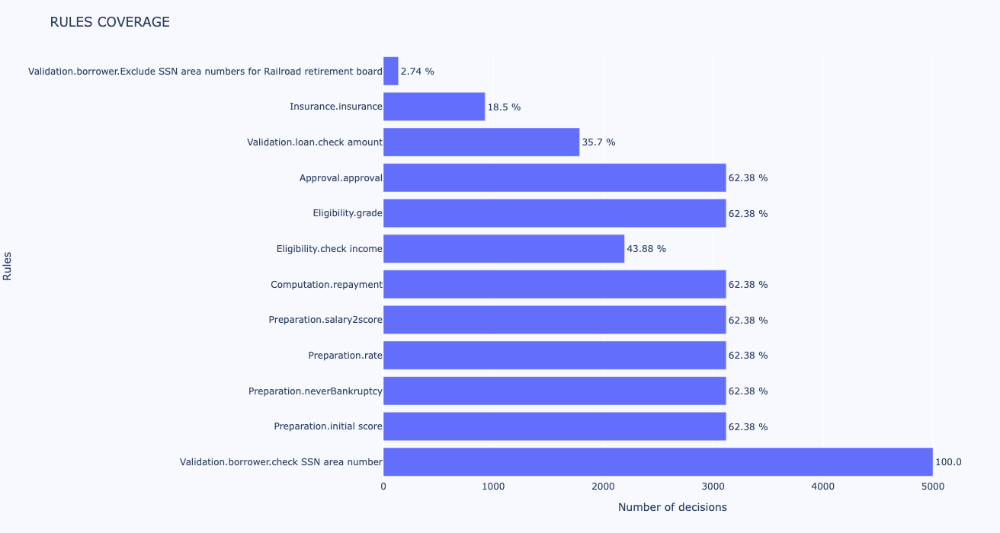

In [97]:
fig = go.Figure(go.Bar(
            x=rules_coverage["Count"],
            y=rules_coverage["Rule"],
            text=[f'{item} %' for item in rules_coverage['Percentage']],
            textposition="outside",
            hovertemplate="<b>%{y}</b><br><b>Count:</b> %{x}<br><b>Percentage:</b> %{text}<extra></extra>",
            orientation='h'))

fig.update_xaxes(title_text='Number of decisions')
fig.update_yaxes(title_text='Rules')

fig.update_layout(
    title='RULES COVERAGE',
    legend=dict(x=0.029, y=1.038, font_size=10),
    margin=dict(l=100, r=50, t=70, b=70),
    height=700,
    paper_bgcolor='rgb(248, 248, 255)',
    plot_bgcolor='rgb(248, 248, 255)',
)
fig.show()

## Conclusion

This notebook shows a business report to analyze a volume of loan approval decisions. It leverages automated decisions performed by IBM Cloud Pak for Business Automation and more precisely Automation Decision services. This report has been generated by the SimuLatte project that takes care of the simulation and the run of report templates.

Tiémoko Dembélé and Pierre Feillet prepared this report. They are members of IBM France lab and developping actively the SimuLatte project.